<a href="https://colab.research.google.com/github/9-coding/ComputerVision_TeamProject/blob/main/ActiveLearning1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
from google.colab import drive
drive.mount('/content/gdrive/')

import os
# 각자 환경에서 이 부분만 변경하여 사용하면 됩니다.
os.chdir('/content/gdrive/MyDrive/CUB_200_2011_repackage_class50')
print(os.getcwd())



Mounted at /content/gdrive/
/content/gdrive/MyDrive/CUB_200_2011_repackage_class50


In [ ]:
# !pip uninstall wandb

In [2]:
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.9/243.9 kB 12.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.9 MB/s eta 0:00:00
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8791 sha256=94daea04869e8a2b890c3caed28e5a87db4032ceacc00b000a6dc44025cab0c8
  Stored in directory: /root/.cache/pip/wheels/e7/f3/22/152153d6eb222ee7a56ff8617d80ee5207207a8c00a7aab794
Successfully built pathtools


In [3]:
!wandb login f9fc6c65de4904021a59f4c8c60b90961f6ec1fb

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [4]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import time
import torch
import torchvision.transforms as transforms
import torchvision.models as models
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from PIL import Image
import random

## wandb ###
import wandb
wandb.init(project='activerleaning1_random4')

def set_seed(seed: int = 42) -> None:
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # Set a fixed value for the hash seed
    os.environ["PYTHONHASHSEED"] = str(seed)
    print(f"Random seed set as {seed}")

set_seed(42)


### GPU Setting ###
USE_CUDA = torch.cuda.is_available()
DEVICE = torch.device("cuda" if USE_CUDA else "cpu")
print(DEVICE)

### Custom Dataset ###
class CUB2011(Dataset):
    def __init__(self, transform, mode='train'):
        self.transform = transform
        self.mode = mode
        self.image_folder = os.listdir(f'./datasets/{mode}')

    def __len__(self):
        return len(self.image_folder)

    def __getitem__(self, idx):
        img_path = self.image_folder[idx]
        img = Image.open(os.path.join('./datasets', self.mode, img_path)).convert('RGB')
        img = self.transform(img)
        label = int(img_path.split('_')[-1].split('.')[0])
        return (img, label)

wandb: Currently logged in as: kdy1021 (computervisionactivelearning). Use `wandb login --relogin` to force relogin


Random seed set as 42
cuda


In [5]:
### Data Augmentation ###

param_dist = {
    'brightness': np.random.uniform(0.5, 0.8),
    'contrast': np.random.uniform(0.0, 1.0),
    'saturation': np.random.uniform(0.5, 0.8),
    'hue': np.random.uniform(0.0, 0.5)
}

color_jitter = transforms.ColorJitter(
    brightness=param_dist['brightness'],
    contrast=param_dist['contrast'],
    saturation=param_dist['saturation'],
    hue=param_dist['hue']
)

# 회전
ROTATION_DEGREE = 30
transforms_rotation = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.RandomRotation(degrees=ROTATION_DEGREE),
    transforms.ToTensor(),
])

# 수평으로 뒤집기
transforms_horizontal_flip = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.RandomHorizontalFlip(p=1.0),
    transforms.ToTensor(),
])

# 색상 변환
transforms_color = transforms.Compose([
    transforms.Resize((448, 448)),
    color_jitter,
    transforms.ToTensor(),
])
transforms_train_with_augmentation = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.ToTensor(),
    # transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Without Augmentation
transforms_train_without_augmentation = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.ToTensor(),
    # transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

transforms_valtest = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.ToTensor(),
    # transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Random Crop
transforms_random_resized_crop = transforms.Compose([
    transforms.RandomResizedCrop(448, scale=(0.8, 1.0)),  # 448x448 크기로 랜덤 리사이즈 및 크롭
    transforms.ToTensor(),
    # transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

#=============== 추가 ================
# 줌 (Zoom)
zoom_scale = (0.8, 1.2)
transforms_zoom = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.RandomResizedCrop(448, scale=zoom_scale),
    transforms.ToTensor(),
    # transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])


transforms_train_combined = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.RandomChoice([
        # transforms.RandomRotation(degrees=ROTATION_DEGREE),
        transforms.RandomHorizontalFlip(p=1.0),
        color_jitter,
        transforms.RandomResizedCrop(448, scale=zoom_scale),
    ]),
    transforms.ToTensor(),
    # transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])


#================



In [9]:
BATCH_SIZE = 16
train_set_without_augmentation = CUB2011(mode='train', transform=transforms_train_without_augmentation)
train_set_with_augmentation = CUB2011(mode='train', transform=transforms_train_with_augmentation)

train_set_rotation = CUB2011(mode='train', transform=transforms_rotation)
train_set_horizontal_flip = CUB2011(mode='train', transform=transforms_horizontal_flip)
train_set_color = CUB2011(mode='train', transform=transforms_color)
train_set_randomcrop =  CUB2011(mode='train', transform=transforms_random_resized_crop)

#==== 추가 =======================
train_set_zoom = CUB2011(mode='train', transform=transforms_zoom)
train_set_random_combined = CUB2011(mode='train', transform=transforms_train_combined)

#===============

# combined_train_set = torch.utils.data.ConcatDataset([transforms_train_without_augmentation, train_set_rotation, train_set_horizontal_flip, train_set_color])
# combined_train_set = torch.utils.data.ConcatDataset([combined_train_set, train_set_horizontal_flip])
# combined_train_set = torch.utils.data.ConcatDataset([combined_train_set])

# combined_train_set = train_set_with_augmentation+ train_set_rotation+ train_set_horizontal_flip + train_set_zoom# + train_set_color
combined_train_set = ConcatDataset([train_set_with_augmentation, train_set_rotation, train_set_horizontal_flip, train_set_zoom, train_set_randomcrop ])


# print(np.shape(combined_train_set))
# exit()

val_set = CUB2011(mode='valid', transform=transforms_valtest)
test_set = CUB2011(mode='test', transform=transforms_valtest)

train_loader_with_augmentation = DataLoader(combined_train_set, batch_size=BATCH_SIZE, shuffle=True)
train_loader_without_augmentation = DataLoader(train_set_without_augmentation, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False)

In [10]:

### Model / Optimizer ###
EPOCH = 20
lr = 0.1
model_with_augmentation = models.resnet18(pretrained=True)
model_without_augmentation = models.resnet18(pretrained=True)

num_features = model_with_augmentation.fc.in_features

### wandb.config values
wandb.config.lr = 1e-1 #0.1
wandb.config.batch_size = BATCH_SIZE
wandb.config.epochs = EPOCH
wandb.config.optimizer = "SGD"
wandb.config.model_architecture = "ResNet18"
wandb.config.data_augmentation = param_dist

# Adjusting for augmentation
model_with_augmentation.fc = nn.Linear(num_features, 50)
model_with_augmentation = model_with_augmentation.to(DEVICE)
optimizer_with_augmentation = optim.SGD(model_with_augmentation.parameters(), lr=lr)

# Adjusting without augmentation
model_without_augmentation.fc = nn.Linear(num_features, 50)
model_without_augmentation = model_without_augmentation.to(DEVICE)
optimizer_without_augmentation = optim.SGD(model_without_augmentation.parameters(), lr=lr)

Train Epoch 0 [0/369]	Loss: 4.139611
Train Epoch 0 [10/369]	Loss: 4.032346
Train Epoch 0 [20/369]	Loss: 2.709445
Train Epoch 0 [30/369]	Loss: 2.138067
Train Epoch 0 [40/369]	Loss: 1.944812
Train Epoch 0 [50/369]	Loss: 1.146677
Train Epoch 0 [60/369]	Loss: 1.046498
Train Epoch 0 [70/369]	Loss: 1.178235
Train Epoch 0 [80/369]	Loss: 0.914051
Train Epoch 0 [90/369]	Loss: 0.783265
Train Epoch 0 [100/369]	Loss: 0.772711
Train Epoch 0 [110/369]	Loss: 0.701298
Train Epoch 0 [120/369]	Loss: 0.525912
Train Epoch 0 [130/369]	Loss: 0.551023
Train Epoch 0 [140/369]	Loss: 0.436803
Train Epoch 0 [150/369]	Loss: 0.462562
Train Epoch 0 [160/369]	Loss: 0.331078
Train Epoch 0 [170/369]	Loss: 0.372321
Train Epoch 0 [180/369]	Loss: 0.308757
Train Epoch 0 [190/369]	Loss: 0.173721
Train Epoch 0 [200/369]	Loss: 0.453039
Train Epoch 0 [210/369]	Loss: 0.337265
Train Epoch 0 [220/369]	Loss: 0.155219
Train Epoch 0 [230/369]	Loss: 0.115419
Train Epoch 0 [240/369]	Loss: 0.193922
Train Epoch 0 [250/369]	Loss: 0.2965

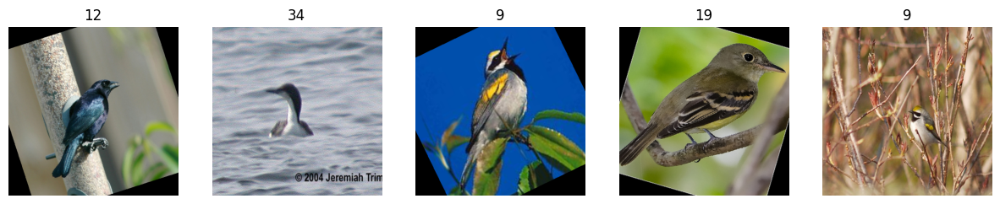

Train Epoch 0 [0/74]	Loss: 4.117429
Train Epoch 0 [10/74]	Loss: 3.835269
Train Epoch 0 [20/74]	Loss: 2.902669
Train Epoch 0 [30/74]	Loss: 1.984259
Train Epoch 0 [40/74]	Loss: 1.873041
Train Epoch 0 [50/74]	Loss: 1.853018
Train Epoch 0 [60/74]	Loss: 1.355155
Train Epoch 0 [70/74]	Loss: 1.099293
Epoch 0
With Augmentation - Train Loss: 0.0570, Validation Loss: 0.4341, Validation Accuracy: 87.16%
Without Augmentation - Train Loss: 0.8921, Validation Loss: 1.8996, Validation Accuracy: 50.00%

Train Epoch 1 [0/369]	Loss: 0.118493
Train Epoch 1 [10/369]	Loss: 0.249479
Train Epoch 1 [20/369]	Loss: 0.046757
Train Epoch 1 [30/369]	Loss: 0.070616
Train Epoch 1 [40/369]	Loss: 0.065812
Train Epoch 1 [50/369]	Loss: 0.070579
Train Epoch 1 [60/369]	Loss: 0.037939
Train Epoch 1 [70/369]	Loss: 0.084644
Train Epoch 1 [80/369]	Loss: 0.041537
Train Epoch 1 [90/369]	Loss: 0.041374
Train Epoch 1 [100/369]	Loss: 0.035581
Train Epoch 1 [110/369]	Loss: 0.157295
Train Epoch 1 [120/369]	Loss: 0.035681
Train Epoch

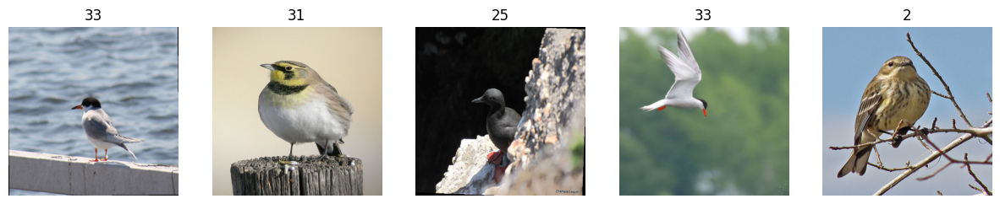

Train Epoch 1 [0/74]	Loss: 0.971832
Train Epoch 1 [10/74]	Loss: 0.837458
Train Epoch 1 [20/74]	Loss: 0.628794
Train Epoch 1 [30/74]	Loss: 0.574590
Train Epoch 1 [40/74]	Loss: 0.487763
Train Epoch 1 [50/74]	Loss: 0.806907
Train Epoch 1 [60/74]	Loss: 0.601983
Train Epoch 1 [70/74]	Loss: 0.672767
Epoch 1
With Augmentation - Train Loss: 0.0294, Validation Loss: 0.2946, Validation Accuracy: 93.24%
Without Augmentation - Train Loss: 0.2496, Validation Loss: 1.2264, Validation Accuracy: 65.54%

Train Epoch 2 [0/369]	Loss: 0.012573
Train Epoch 2 [10/369]	Loss: 0.019001
Train Epoch 2 [20/369]	Loss: 0.010956
Train Epoch 2 [30/369]	Loss: 0.010419
Train Epoch 2 [40/369]	Loss: 0.010794
Train Epoch 2 [50/369]	Loss: 0.016776
Train Epoch 2 [60/369]	Loss: 0.034532
Train Epoch 2 [70/369]	Loss: 0.017828
Train Epoch 2 [80/369]	Loss: 0.016982
Train Epoch 2 [90/369]	Loss: 0.008428
Train Epoch 2 [100/369]	Loss: 0.010695
Train Epoch 2 [110/369]	Loss: 0.008162
Train Epoch 2 [120/369]	Loss: 0.012864
Train Epoch

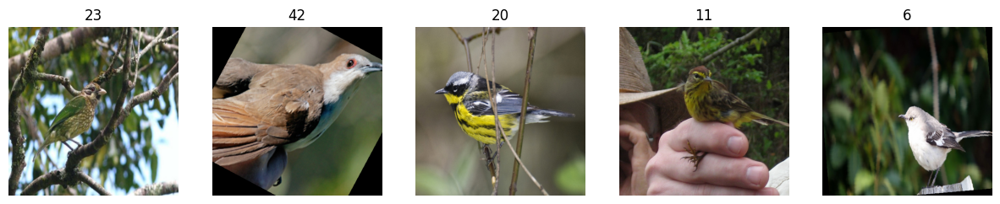

Train Epoch 2 [0/74]	Loss: 0.303060
Train Epoch 2 [10/74]	Loss: 0.288056
Train Epoch 2 [20/74]	Loss: 0.148225
Train Epoch 2 [30/74]	Loss: 0.158764
Train Epoch 2 [40/74]	Loss: 0.092611
Train Epoch 2 [50/74]	Loss: 0.120373
Train Epoch 2 [60/74]	Loss: 0.150343
Train Epoch 2 [70/74]	Loss: 0.123345
Epoch 2
With Augmentation - Train Loss: 0.0110, Validation Loss: 0.2724, Validation Accuracy: 92.57%
Without Augmentation - Train Loss: 0.1845, Validation Loss: 0.5371, Validation Accuracy: 88.51%

Train Epoch 3 [0/369]	Loss: 0.003703
Train Epoch 3 [10/369]	Loss: 0.013283
Train Epoch 3 [20/369]	Loss: 0.025744
Train Epoch 3 [30/369]	Loss: 0.008514
Train Epoch 3 [40/369]	Loss: 0.006161
Train Epoch 3 [50/369]	Loss: 0.005195
Train Epoch 3 [60/369]	Loss: 0.003841
Train Epoch 3 [70/369]	Loss: 0.008686
Train Epoch 3 [80/369]	Loss: 0.009288
Train Epoch 3 [90/369]	Loss: 0.004767
Train Epoch 3 [100/369]	Loss: 0.006492
Train Epoch 3 [110/369]	Loss: 0.004562
Train Epoch 3 [120/369]	Loss: 0.008253
Train Epoch

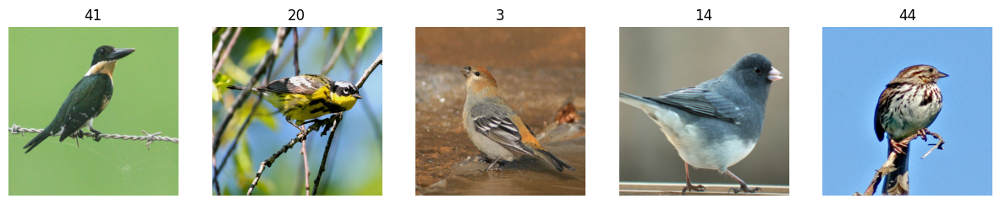

Train Epoch 3 [0/74]	Loss: 0.096808
Train Epoch 3 [10/74]	Loss: 0.064000
Train Epoch 3 [20/74]	Loss: 0.056365
Train Epoch 3 [30/74]	Loss: 0.052628
Train Epoch 3 [40/74]	Loss: 0.058109
Train Epoch 3 [50/74]	Loss: 0.046790
Train Epoch 3 [60/74]	Loss: 0.055329
Train Epoch 3 [70/74]	Loss: 0.048307
Epoch 3
With Augmentation - Train Loss: 0.0053, Validation Loss: 0.5802, Validation Accuracy: 86.49%
Without Augmentation - Train Loss: 0.0518, Validation Loss: 0.4032, Validation Accuracy: 91.89%

Train Epoch 4 [0/369]	Loss: 0.009555
Train Epoch 4 [10/369]	Loss: 0.002689
Train Epoch 4 [20/369]	Loss: 0.017524
Train Epoch 4 [30/369]	Loss: 0.045605
Train Epoch 4 [40/369]	Loss: 0.013232
Train Epoch 4 [50/369]	Loss: 0.004710
Train Epoch 4 [60/369]	Loss: 0.004410
Train Epoch 4 [70/369]	Loss: 0.003943
Train Epoch 4 [80/369]	Loss: 0.003879
Train Epoch 4 [90/369]	Loss: 0.003897
Train Epoch 4 [100/369]	Loss: 0.003989
Train Epoch 4 [110/369]	Loss: 0.006916
Train Epoch 4 [120/369]	Loss: 0.005499
Train Epoch

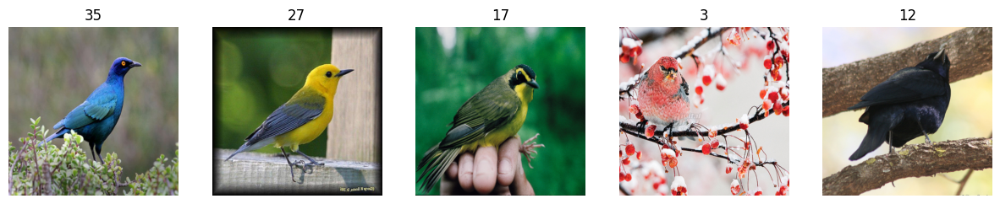

Train Epoch 4 [0/74]	Loss: 0.031607
Train Epoch 4 [10/74]	Loss: 0.024681
Train Epoch 4 [20/74]	Loss: 0.026201
Train Epoch 4 [30/74]	Loss: 0.054368
Train Epoch 4 [40/74]	Loss: 0.023651
Train Epoch 4 [50/74]	Loss: 0.029759
Train Epoch 4 [60/74]	Loss: 0.039158
Train Epoch 4 [70/74]	Loss: 0.051782
Epoch 4
With Augmentation - Train Loss: 0.1105, Validation Loss: 1.8876, Validation Accuracy: 59.12%
Without Augmentation - Train Loss: 0.0444, Validation Loss: 0.3615, Validation Accuracy: 92.23%

Train Epoch 5 [0/369]	Loss: 0.009735
Train Epoch 5 [10/369]	Loss: 0.007655
Train Epoch 5 [20/369]	Loss: 0.004930
Train Epoch 5 [30/369]	Loss: 0.005432
Train Epoch 5 [40/369]	Loss: 0.002773
Train Epoch 5 [50/369]	Loss: 0.003774
Train Epoch 5 [60/369]	Loss: 0.002973
Train Epoch 5 [70/369]	Loss: 0.002835
Train Epoch 5 [80/369]	Loss: 0.004879
Train Epoch 5 [90/369]	Loss: 0.005476
Train Epoch 5 [100/369]	Loss: 0.003387
Train Epoch 5 [110/369]	Loss: 0.003836
Train Epoch 5 [120/369]	Loss: 0.003432
Train Epoch

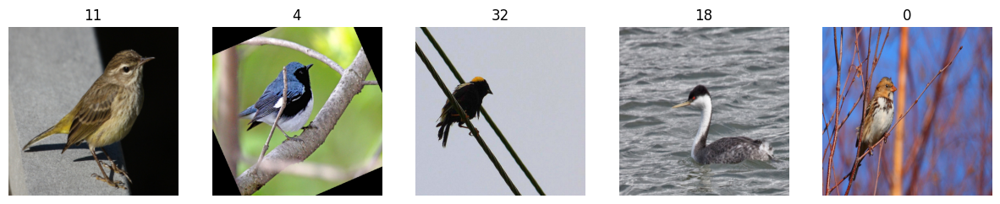

Train Epoch 5 [0/74]	Loss: 0.017336
Train Epoch 5 [10/74]	Loss: 0.027998
Train Epoch 5 [20/74]	Loss: 0.026183
Train Epoch 5 [30/74]	Loss: 0.027359
Train Epoch 5 [40/74]	Loss: 0.033051
Train Epoch 5 [50/74]	Loss: 0.020625
Train Epoch 5 [60/74]	Loss: 0.018786
Train Epoch 5 [70/74]	Loss: 0.016946
Epoch 5
With Augmentation - Train Loss: 0.0039, Validation Loss: 0.3236, Validation Accuracy: 92.23%
Without Augmentation - Train Loss: 0.0187, Validation Loss: 0.3333, Validation Accuracy: 93.58%

Train Epoch 6 [0/369]	Loss: 0.005622
Train Epoch 6 [10/369]	Loss: 0.003492
Train Epoch 6 [20/369]	Loss: 0.003318
Train Epoch 6 [30/369]	Loss: 0.010744
Train Epoch 6 [40/369]	Loss: 0.002778
Train Epoch 6 [50/369]	Loss: 0.003851
Train Epoch 6 [60/369]	Loss: 0.002927
Train Epoch 6 [70/369]	Loss: 0.005380
Train Epoch 6 [80/369]	Loss: 0.002677
Train Epoch 6 [90/369]	Loss: 0.002280
Train Epoch 6 [100/369]	Loss: 0.003475
Train Epoch 6 [110/369]	Loss: 0.004683
Train Epoch 6 [120/369]	Loss: 0.004164
Train Epoch

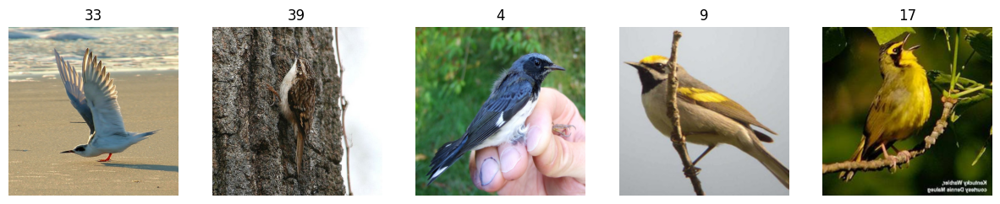

Train Epoch 6 [0/74]	Loss: 0.012481
Train Epoch 6 [10/74]	Loss: 0.013410
Train Epoch 6 [20/74]	Loss: 0.017251
Train Epoch 6 [30/74]	Loss: 0.013498
Train Epoch 6 [40/74]	Loss: 0.013845
Train Epoch 6 [50/74]	Loss: 0.039423
Train Epoch 6 [60/74]	Loss: 0.019962
Train Epoch 6 [70/74]	Loss: 0.011909
Epoch 6
With Augmentation - Train Loss: 0.0043, Validation Loss: 0.2771, Validation Accuracy: 92.91%
Without Augmentation - Train Loss: 0.0303, Validation Loss: 0.3341, Validation Accuracy: 91.89%

Train Epoch 7 [0/369]	Loss: 0.001863
Train Epoch 7 [10/369]	Loss: 0.002611
Train Epoch 7 [20/369]	Loss: 0.002494
Train Epoch 7 [30/369]	Loss: 0.005092
Train Epoch 7 [40/369]	Loss: 0.005203
Train Epoch 7 [50/369]	Loss: 0.001764
Train Epoch 7 [60/369]	Loss: 0.001737
Train Epoch 7 [70/369]	Loss: 0.002082
Train Epoch 7 [80/369]	Loss: 0.001554
Train Epoch 7 [90/369]	Loss: 0.001448
Train Epoch 7 [100/369]	Loss: 0.002356
Train Epoch 7 [110/369]	Loss: 0.002758
Train Epoch 7 [120/369]	Loss: 0.002007
Train Epoch

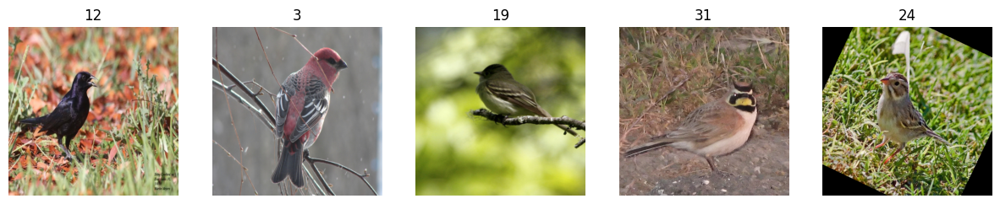

Train Epoch 7 [0/74]	Loss: 0.011590
Train Epoch 7 [10/74]	Loss: 0.014841
Train Epoch 7 [20/74]	Loss: 0.011112
Train Epoch 7 [30/74]	Loss: 0.013612
Train Epoch 7 [40/74]	Loss: 0.008348
Train Epoch 7 [50/74]	Loss: 0.020849
Train Epoch 7 [60/74]	Loss: 0.009500
Train Epoch 7 [70/74]	Loss: 0.009273
Epoch 7
With Augmentation - Train Loss: 0.0037, Validation Loss: 0.2667, Validation Accuracy: 94.26%
Without Augmentation - Train Loss: 0.0087, Validation Loss: 0.3308, Validation Accuracy: 92.57%

Train Epoch 8 [0/369]	Loss: 0.003828
Train Epoch 8 [10/369]	Loss: 0.003100
Train Epoch 8 [20/369]	Loss: 0.001265
Train Epoch 8 [30/369]	Loss: 0.001615
Train Epoch 8 [40/369]	Loss: 0.003791
Train Epoch 8 [50/369]	Loss: 0.002156
Train Epoch 8 [60/369]	Loss: 0.004952
Train Epoch 8 [70/369]	Loss: 0.002295
Train Epoch 8 [80/369]	Loss: 0.002194
Train Epoch 8 [90/369]	Loss: 0.001539
Train Epoch 8 [100/369]	Loss: 0.001376
Train Epoch 8 [110/369]	Loss: 0.002216
Train Epoch 8 [120/369]	Loss: 0.001966
Train Epoch

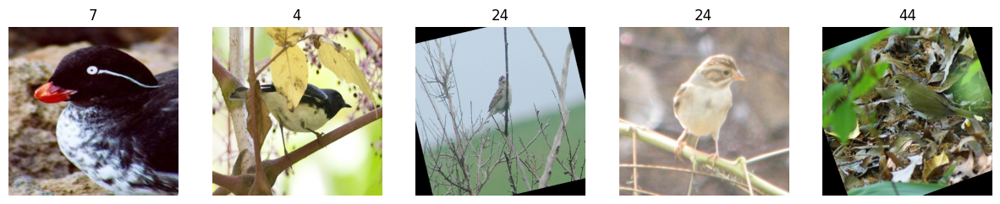

Train Epoch 8 [0/74]	Loss: 0.015267
Train Epoch 8 [10/74]	Loss: 0.008686
Train Epoch 8 [20/74]	Loss: 0.009884
Train Epoch 8 [30/74]	Loss: 0.010543
Train Epoch 8 [40/74]	Loss: 0.011904
Train Epoch 8 [50/74]	Loss: 0.008521
Train Epoch 8 [60/74]	Loss: 0.012592
Train Epoch 8 [70/74]	Loss: 0.008487
Epoch 8
With Augmentation - Train Loss: 0.0025, Validation Loss: 0.2576, Validation Accuracy: 94.59%
Without Augmentation - Train Loss: 0.0103, Validation Loss: 0.3224, Validation Accuracy: 92.91%

Train Epoch 9 [0/369]	Loss: 0.002697
Train Epoch 9 [10/369]	Loss: 0.001697
Train Epoch 9 [20/369]	Loss: 0.003090
Train Epoch 9 [30/369]	Loss: 0.004264
Train Epoch 9 [40/369]	Loss: 0.001452
Train Epoch 9 [50/369]	Loss: 0.004605
Train Epoch 9 [60/369]	Loss: 0.003823
Train Epoch 9 [70/369]	Loss: 0.001806
Train Epoch 9 [80/369]	Loss: 0.001383
Train Epoch 9 [90/369]	Loss: 0.057947
Train Epoch 9 [100/369]	Loss: 0.003376
Train Epoch 9 [110/369]	Loss: 0.007708
Train Epoch 9 [120/369]	Loss: 0.001528
Train Epoch

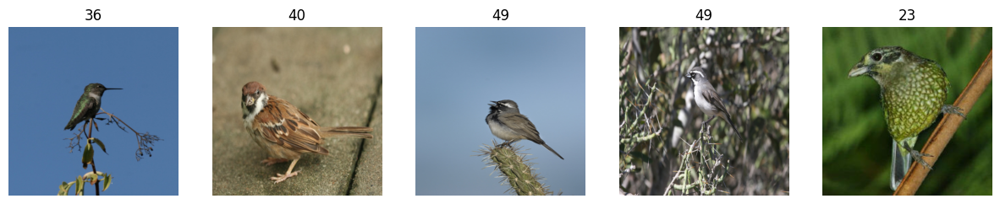

Train Epoch 9 [0/74]	Loss: 0.005943
Train Epoch 9 [10/74]	Loss: 0.009881
Train Epoch 9 [20/74]	Loss: 0.008289
Train Epoch 9 [30/74]	Loss: 0.008229
Train Epoch 9 [40/74]	Loss: 0.008460
Train Epoch 9 [50/74]	Loss: 0.008077
Train Epoch 9 [60/74]	Loss: 0.008917
Train Epoch 9 [70/74]	Loss: 0.005705
Epoch 9
With Augmentation - Train Loss: 0.0042, Validation Loss: 0.2850, Validation Accuracy: 93.24%
Without Augmentation - Train Loss: 0.0094, Validation Loss: 0.3190, Validation Accuracy: 92.91%

Train Epoch 10 [0/369]	Loss: 0.001613
Train Epoch 10 [10/369]	Loss: 0.000903
Train Epoch 10 [20/369]	Loss: 0.001387
Train Epoch 10 [30/369]	Loss: 0.001619
Train Epoch 10 [40/369]	Loss: 0.001952
Train Epoch 10 [50/369]	Loss: 0.000673
Train Epoch 10 [60/369]	Loss: 0.001247
Train Epoch 10 [70/369]	Loss: 0.001218
Train Epoch 10 [80/369]	Loss: 0.001116
Train Epoch 10 [90/369]	Loss: 0.002616
Train Epoch 10 [100/369]	Loss: 0.000442
Train Epoch 10 [110/369]	Loss: 0.000838
Train Epoch 10 [120/369]	Loss: 0.00305

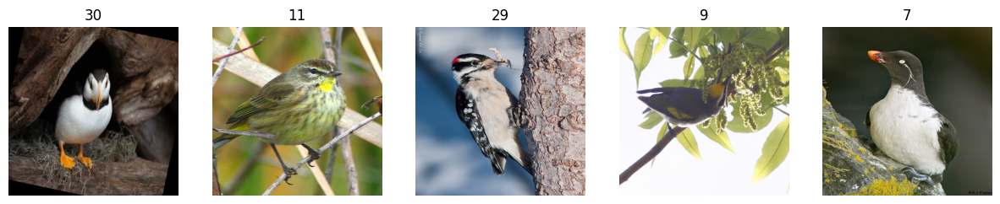

Train Epoch 10 [0/74]	Loss: 0.010551
Train Epoch 10 [10/74]	Loss: 0.009160
Train Epoch 10 [20/74]	Loss: 0.009067
Train Epoch 10 [30/74]	Loss: 0.009338
Train Epoch 10 [40/74]	Loss: 0.009019
Train Epoch 10 [50/74]	Loss: 0.004693
Train Epoch 10 [60/74]	Loss: 0.015039
Train Epoch 10 [70/74]	Loss: 0.006649
Epoch 10
With Augmentation - Train Loss: 0.0015, Validation Loss: 0.2747, Validation Accuracy: 94.26%
Without Augmentation - Train Loss: 0.0110, Validation Loss: 0.3247, Validation Accuracy: 92.57%

Train Epoch 11 [0/369]	Loss: 0.000985
Train Epoch 11 [10/369]	Loss: 0.002030
Train Epoch 11 [20/369]	Loss: 0.001621
Train Epoch 11 [30/369]	Loss: 0.001658
Train Epoch 11 [40/369]	Loss: 0.000844
Train Epoch 11 [50/369]	Loss: 0.001285
Train Epoch 11 [60/369]	Loss: 0.000839
Train Epoch 11 [70/369]	Loss: 0.001109
Train Epoch 11 [80/369]	Loss: 0.001969
Train Epoch 11 [90/369]	Loss: 0.004540
Train Epoch 11 [100/369]	Loss: 0.000697
Train Epoch 11 [110/369]	Loss: 0.001060
Train Epoch 11 [120/369]	Loss

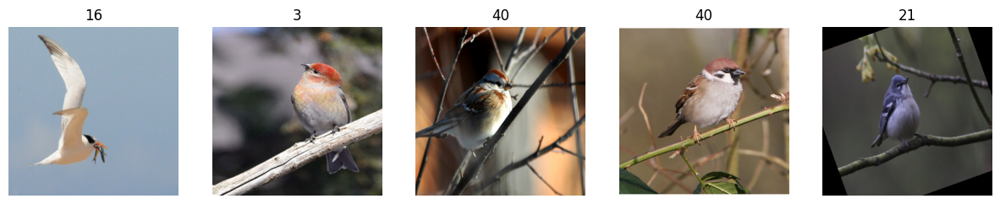

Train Epoch 11 [0/74]	Loss: 0.007225
Train Epoch 11 [10/74]	Loss: 0.004726
Train Epoch 11 [20/74]	Loss: 0.006345
Train Epoch 11 [30/74]	Loss: 0.004622
Train Epoch 11 [40/74]	Loss: 0.007036
Train Epoch 11 [50/74]	Loss: 0.006287
Train Epoch 11 [60/74]	Loss: 0.007076
Train Epoch 11 [70/74]	Loss: 0.007186
Epoch 11
With Augmentation - Train Loss: 0.0009, Validation Loss: 0.2716, Validation Accuracy: 93.92%
Without Augmentation - Train Loss: 0.0067, Validation Loss: 0.3164, Validation Accuracy: 93.24%

Train Epoch 12 [0/369]	Loss: 0.000645
Train Epoch 12 [10/369]	Loss: 0.000951
Train Epoch 12 [20/369]	Loss: 0.001213
Train Epoch 12 [30/369]	Loss: 0.001538
Train Epoch 12 [40/369]	Loss: 0.001054
Train Epoch 12 [50/369]	Loss: 0.000824
Train Epoch 12 [60/369]	Loss: 0.002323
Train Epoch 12 [70/369]	Loss: 0.000541
Train Epoch 12 [80/369]	Loss: 0.000855
Train Epoch 12 [90/369]	Loss: 0.000869
Train Epoch 12 [100/369]	Loss: 0.000761
Train Epoch 12 [110/369]	Loss: 0.000895
Train Epoch 12 [120/369]	Loss

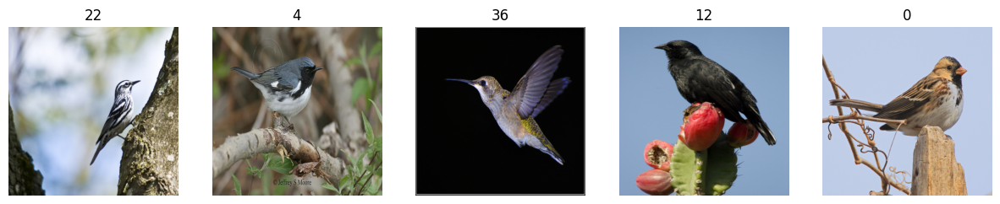

Train Epoch 12 [0/74]	Loss: 0.005930
Train Epoch 12 [10/74]	Loss: 0.008363
Train Epoch 12 [20/74]	Loss: 0.004821
Train Epoch 12 [30/74]	Loss: 0.006237
Train Epoch 12 [40/74]	Loss: 0.007455
Train Epoch 12 [50/74]	Loss: 0.003249
Train Epoch 12 [60/74]	Loss: 0.005776
Train Epoch 12 [70/74]	Loss: 0.005351
Epoch 12
With Augmentation - Train Loss: 0.0028, Validation Loss: 0.2674, Validation Accuracy: 93.92%
Without Augmentation - Train Loss: 0.0072, Validation Loss: 0.3129, Validation Accuracy: 92.91%

Train Epoch 13 [0/369]	Loss: 0.000710
Train Epoch 13 [10/369]	Loss: 0.002186
Train Epoch 13 [20/369]	Loss: 0.000483
Train Epoch 13 [30/369]	Loss: 0.000431
Train Epoch 13 [40/369]	Loss: 0.001145
Train Epoch 13 [50/369]	Loss: 0.000787
Train Epoch 13 [60/369]	Loss: 0.000853
Train Epoch 13 [70/369]	Loss: 0.001150
Train Epoch 13 [80/369]	Loss: 0.000897
Train Epoch 13 [90/369]	Loss: 0.000767
Train Epoch 13 [100/369]	Loss: 0.000631
Train Epoch 13 [110/369]	Loss: 0.000847
Train Epoch 13 [120/369]	Loss

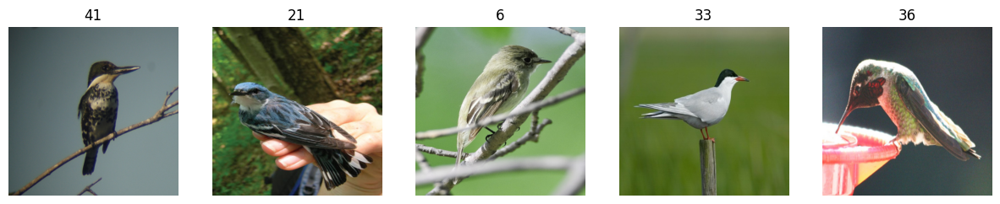

Train Epoch 13 [0/74]	Loss: 0.004200
Train Epoch 13 [10/74]	Loss: 0.006621
Train Epoch 13 [20/74]	Loss: 0.006932
Train Epoch 13 [30/74]	Loss: 0.006784
Train Epoch 13 [40/74]	Loss: 0.005556
Train Epoch 13 [50/74]	Loss: 0.005882
Train Epoch 13 [60/74]	Loss: 0.006074
Train Epoch 13 [70/74]	Loss: 0.005765
Epoch 13
With Augmentation - Train Loss: 0.0006, Validation Loss: 0.2635, Validation Accuracy: 94.26%
Without Augmentation - Train Loss: 0.0075, Validation Loss: 0.3119, Validation Accuracy: 93.24%

Train Epoch 14 [0/369]	Loss: 0.000865
Train Epoch 14 [10/369]	Loss: 0.000438
Train Epoch 14 [20/369]	Loss: 0.000692
Train Epoch 14 [30/369]	Loss: 0.000834
Train Epoch 14 [40/369]	Loss: 0.000649
Train Epoch 14 [50/369]	Loss: 0.000585
Train Epoch 14 [60/369]	Loss: 0.002658
Train Epoch 14 [70/369]	Loss: 0.002555
Train Epoch 14 [80/369]	Loss: 0.000556
Train Epoch 14 [90/369]	Loss: 0.002330
Train Epoch 14 [100/369]	Loss: 0.000844
Train Epoch 14 [110/369]	Loss: 0.000719
Train Epoch 14 [120/369]	Loss

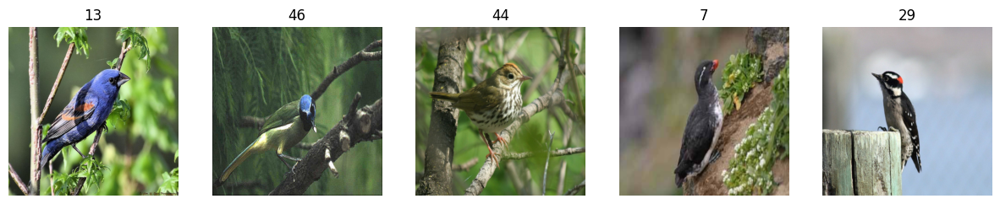

Train Epoch 14 [0/74]	Loss: 0.004986
Train Epoch 14 [10/74]	Loss: 0.005594
Train Epoch 14 [20/74]	Loss: 0.004727
Train Epoch 14 [30/74]	Loss: 0.004464
Train Epoch 14 [40/74]	Loss: 0.008205
Train Epoch 14 [50/74]	Loss: 0.004244
Train Epoch 14 [60/74]	Loss: 0.003612
Train Epoch 14 [70/74]	Loss: 0.005297
Epoch 14
With Augmentation - Train Loss: 0.0007, Validation Loss: 0.2541, Validation Accuracy: 94.59%
Without Augmentation - Train Loss: 0.0039, Validation Loss: 0.3105, Validation Accuracy: 92.91%

Train Epoch 15 [0/369]	Loss: 0.000724
Train Epoch 15 [10/369]	Loss: 0.001269
Train Epoch 15 [20/369]	Loss: 0.001052
Train Epoch 15 [30/369]	Loss: 0.001198
Train Epoch 15 [40/369]	Loss: 0.000733
Train Epoch 15 [50/369]	Loss: 0.002053
Train Epoch 15 [60/369]	Loss: 0.000493
Train Epoch 15 [70/369]	Loss: 0.001324
Train Epoch 15 [80/369]	Loss: 0.001845
Train Epoch 15 [90/369]	Loss: 0.000630
Train Epoch 15 [100/369]	Loss: 0.001108
Train Epoch 15 [110/369]	Loss: 0.000518
Train Epoch 15 [120/369]	Loss

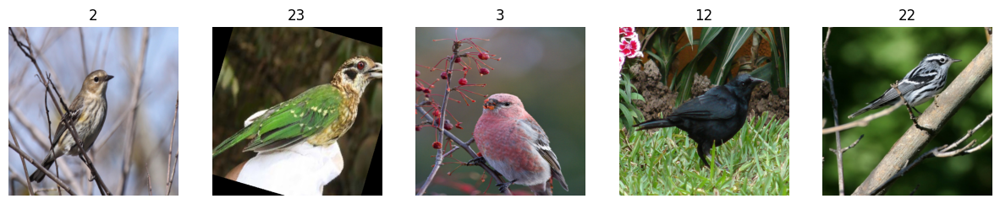

Train Epoch 15 [0/74]	Loss: 0.004489
Train Epoch 15 [10/74]	Loss: 0.003204
Train Epoch 15 [20/74]	Loss: 0.004092
Train Epoch 15 [30/74]	Loss: 0.003821
Train Epoch 15 [40/74]	Loss: 0.005140
Train Epoch 15 [50/74]	Loss: 0.003378
Train Epoch 15 [60/74]	Loss: 0.007780
Train Epoch 15 [70/74]	Loss: 0.004334
Epoch 15
With Augmentation - Train Loss: 0.0007, Validation Loss: 0.2595, Validation Accuracy: 93.92%
Without Augmentation - Train Loss: 0.0066, Validation Loss: 0.3107, Validation Accuracy: 93.24%

Train Epoch 16 [0/369]	Loss: 0.000739
Train Epoch 16 [10/369]	Loss: 0.001124
Train Epoch 16 [20/369]	Loss: 0.000670
Train Epoch 16 [30/369]	Loss: 0.001086
Train Epoch 16 [40/369]	Loss: 0.001400
Train Epoch 16 [50/369]	Loss: 0.000650
Train Epoch 16 [60/369]	Loss: 0.000865
Train Epoch 16 [70/369]	Loss: 0.001016
Train Epoch 16 [80/369]	Loss: 0.000574
Train Epoch 16 [90/369]	Loss: 0.000342
Train Epoch 16 [100/369]	Loss: 0.000702
Train Epoch 16 [110/369]	Loss: 0.000240
Train Epoch 16 [120/369]	Loss

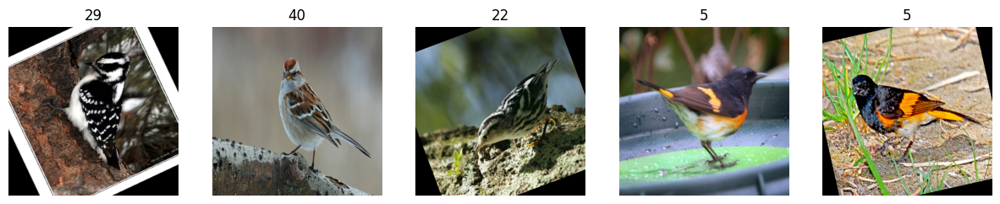

Train Epoch 16 [0/74]	Loss: 0.004550
Train Epoch 16 [10/74]	Loss: 0.004763
Train Epoch 16 [20/74]	Loss: 0.003972
Train Epoch 16 [30/74]	Loss: 0.003437
Train Epoch 16 [40/74]	Loss: 0.004113
Train Epoch 16 [50/74]	Loss: 0.004859
Train Epoch 16 [60/74]	Loss: 0.003959
Train Epoch 16 [70/74]	Loss: 0.005483
Epoch 16
With Augmentation - Train Loss: 0.0008, Validation Loss: 0.2607, Validation Accuracy: 94.26%
Without Augmentation - Train Loss: 0.0060, Validation Loss: 0.3089, Validation Accuracy: 92.57%

Train Epoch 17 [0/369]	Loss: 0.000528
Train Epoch 17 [10/369]	Loss: 0.000816
Train Epoch 17 [20/369]	Loss: 0.001845
Train Epoch 17 [30/369]	Loss: 0.000287
Train Epoch 17 [40/369]	Loss: 0.000599
Train Epoch 17 [50/369]	Loss: 0.000459
Train Epoch 17 [60/369]	Loss: 0.000978
Train Epoch 17 [70/369]	Loss: 0.000318
Train Epoch 17 [80/369]	Loss: 0.000500
Train Epoch 17 [90/369]	Loss: 0.000891
Train Epoch 17 [100/369]	Loss: 0.000468
Train Epoch 17 [110/369]	Loss: 0.000463
Train Epoch 17 [120/369]	Loss

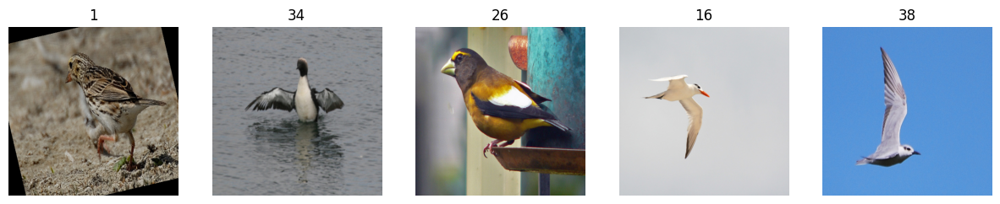

Train Epoch 17 [0/74]	Loss: 0.003179
Train Epoch 17 [10/74]	Loss: 0.003720
Train Epoch 17 [20/74]	Loss: 0.003883
Train Epoch 17 [30/74]	Loss: 0.004222
Train Epoch 17 [40/74]	Loss: 0.004302
Train Epoch 17 [50/74]	Loss: 0.002521
Train Epoch 17 [60/74]	Loss: 0.005481
Train Epoch 17 [70/74]	Loss: 0.003636
Epoch 17
With Augmentation - Train Loss: 0.0004, Validation Loss: 0.2690, Validation Accuracy: 94.26%
Without Augmentation - Train Loss: 0.0042, Validation Loss: 0.3092, Validation Accuracy: 92.91%

Train Epoch 18 [0/369]	Loss: 0.000797
Train Epoch 18 [10/369]	Loss: 0.001142
Train Epoch 18 [20/369]	Loss: 0.002149
Train Epoch 18 [30/369]	Loss: 0.000703
Train Epoch 18 [40/369]	Loss: 0.001208
Train Epoch 18 [50/369]	Loss: 0.001030
Train Epoch 18 [60/369]	Loss: 0.001008
Train Epoch 18 [70/369]	Loss: 0.000980
Train Epoch 18 [80/369]	Loss: 0.000408
Train Epoch 18 [90/369]	Loss: 0.000679
Train Epoch 18 [100/369]	Loss: 0.000432
Train Epoch 18 [110/369]	Loss: 0.000509
Train Epoch 18 [120/369]	Loss

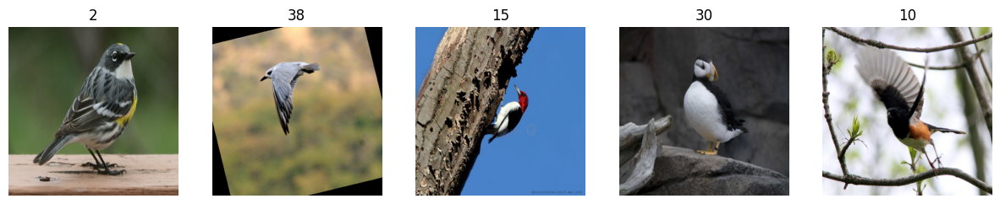

Train Epoch 18 [0/74]	Loss: 0.002628
Train Epoch 18 [10/74]	Loss: 0.003114
Train Epoch 18 [20/74]	Loss: 0.002799
Train Epoch 18 [30/74]	Loss: 0.004784
Train Epoch 18 [40/74]	Loss: 0.004016
Train Epoch 18 [50/74]	Loss: 0.003969
Train Epoch 18 [60/74]	Loss: 0.003145
Train Epoch 18 [70/74]	Loss: 0.002185
Epoch 18
With Augmentation - Train Loss: 0.0008, Validation Loss: 0.2662, Validation Accuracy: 93.92%
Without Augmentation - Train Loss: 0.0056, Validation Loss: 0.3150, Validation Accuracy: 92.57%

Train Epoch 19 [0/369]	Loss: 0.000619
Train Epoch 19 [10/369]	Loss: 0.000683
Train Epoch 19 [20/369]	Loss: 0.000419
Train Epoch 19 [30/369]	Loss: 0.000889
Train Epoch 19 [40/369]	Loss: 0.000322
Train Epoch 19 [50/369]	Loss: 0.000868
Train Epoch 19 [60/369]	Loss: 0.001403
Train Epoch 19 [70/369]	Loss: 0.000642
Train Epoch 19 [80/369]	Loss: 0.000579
Train Epoch 19 [90/369]	Loss: 0.001076
Train Epoch 19 [100/369]	Loss: 0.000485
Train Epoch 19 [110/369]	Loss: 0.000227
Train Epoch 19 [120/369]	Loss

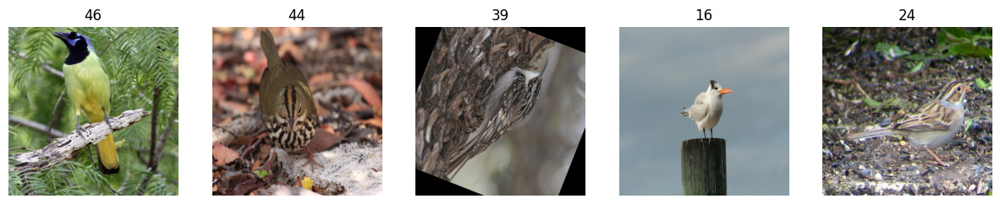

Train Epoch 19 [0/74]	Loss: 0.003358
Train Epoch 19 [10/74]	Loss: 0.004615
Train Epoch 19 [20/74]	Loss: 0.002535
Train Epoch 19 [30/74]	Loss: 0.002656
Train Epoch 19 [40/74]	Loss: 0.002469
Train Epoch 19 [50/74]	Loss: 0.004574
Train Epoch 19 [60/74]	Loss: 0.002396
Train Epoch 19 [70/74]	Loss: 0.002504
Epoch 19
With Augmentation - Train Loss: 0.0012, Validation Loss: 0.2649, Validation Accuracy: 94.26%
Without Augmentation - Train Loss: 0.0033, Validation Loss: 0.3103, Validation Accuracy: 92.57%

[FINAL with Augmentation] Test Loss: 0.2213, Accuracy: 94.6309%
[FINAL without Augmentation] Test Loss: 0.2918, Accuracy: 92.9530%
Best Accuracy with Augmentation: 94.59%
Best Accuracy without Augmentation: 93.58%
Elapsed Time: 1h, 21m, 19s
time: 1h, 81m, 19s


In [ ]:
### Train/Evaluation ###
def train(model, train_loader, optimizer, epoch):
    model.train()
    for i, (image, target) in enumerate(train_loader):
        image, target = image.to(DEVICE), target.to(DEVICE)
        output = model(image)
        optimizer.zero_grad()
        train_loss = F.cross_entropy(output, target).to(DEVICE)
        train_loss.backward()
        optimizer.step()

        if i % 10 == 0:
            print(f'Train Epoch {epoch} [{i}/{len(train_loader)}]\tLoss: {train_loss.item():.6f}')
    return train_loss

def evaluate(model, val_loader):
    model.eval()
    eval_loss = 0
    correct = 0
    with torch.no_grad():
        for i, (image, target) in enumerate(val_loader):
            image, target = image.to(DEVICE), target.to(DEVICE)
            output = model(image)
            eval_loss += F.cross_entropy(output, target, reduction='sum').item()
            pred = output.max(1, keepdim=True)[1]
            correct += pred.eq(target.view_as(pred)).sum().item()
        eval_loss /= len(val_loader.dataset)
        eval_accuracy = 100 * correct / len(val_loader.dataset)
        return eval_loss, eval_accuracy

### Main ###
start = time.time()
best_with_augmentation = 0
best_without_augmentation = 0

### wandb ###
wandb.watch(model_with_augmentation, log="all")
wandb.watch(model_without_augmentation, log="all")

for epoch in range(EPOCH):
    # With Augmentation
    train_loss_with_augmentation = train(model_with_augmentation, train_loader_with_augmentation, optimizer_with_augmentation, epoch)
    val_loss_with_augmentation, val_accuracy_with_augmentation = evaluate(model_with_augmentation, val_loader)

    # Save best model
    if val_accuracy_with_augmentation > best_with_augmentation:
        best_with_augmentation = val_accuracy_with_augmentation
        torch.save(model_with_augmentation.state_dict(), "./best_model_with_augmentation.pth")

    # augmentation 적용한 이미지 보기
    dataiter = iter(train_loader_with_augmentation)
    images, labels = dataiter.__next__()
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))
    for i in range(5):
      image = images[i].numpy().transpose((1, 2, 0))
      image = np.clip(image, 0, 1)
      axes[i].imshow(image)
      axes[i].set_title(labels[i].item())
      axes[i].axis('off')
    plt.show()

    # Without Augmentation
    train_loss_without_augmentation = train(model_without_augmentation, train_loader_without_augmentation, optimizer_without_augmentation, epoch)
    val_loss_without_augmentation, val_accuracy_without_augmentation = evaluate(model_without_augmentation, val_loader)

    # Logging for model without augmentation
    wandb.log({
        'epoch': epoch,
        'train_loss_with_augmentation': train_loss_with_augmentation.item(),
        'val_loss_with_augmentation': val_loss_with_augmentation,
        'val_accuracy_with_augmentation': val_accuracy_with_augmentation
        'train_loss_without_augmentation': train_loss_without_augmentation.item(),
        'val_loss_without_augmentation': val_loss_without_augmentation,
        'val_accuracy_without_augmentation': val_accuracy_without_augmentation
    })

    if val_accuracy_without_augmentation > best_without_augmentation:
        best_without_augmentation = val_accuracy_without_augmentation
        torch.save(model_without_augmentation.state_dict(), "./best_model_without_augmentation.pth")

    print(f'Epoch {epoch}')
    print(f"With Augmentation - Train Loss: {train_loss_with_augmentation.item():.4f}, Validation Loss: {val_loss_with_augmentation:.4f}, Validation Accuracy: {val_accuracy_with_augmentation:.2f}%")
    print(f"Without Augmentation - Train Loss: {train_loss_without_augmentation.item():.4f}, Validation Loss: {val_loss_without_augmentation:.4f}, Validation Accuracy: {val_accuracy_without_augmentation:.2f}%")
    print("")

# Test results
test_loss_with_augmentation, test_accuracy_with_augmentation = evaluate(model_with_augmentation, test_loader)
test_loss_without_augmentation, test_accuracy_without_augmentation = evaluate(model_without_augmentation, test_loader)

wandb.log({'test_accuracy_with_augmentation': test_accuracy_with_augmentation})

print(f'[FINAL with Augmentation] Test Loss: {test_loss_with_augmentation:.4f}, Accuracy: {test_accuracy_with_augmentation:.4f}%')
print(f'[FINAL without Augmentation] Test Loss: {test_loss_without_augmentation:.4f}, Accuracy: {test_accuracy_without_augmentation:.4f}%')

end = time.time()
elasped_time = end - start
print(f"Best Accuracy with Augmentation: {best_with_augmentation:.2f}%")
print(f"Best Accuracy without Augmentation: {best_without_augmentation:.2f}%")
print(f"Elapsed Time: {int(elasped_time/3600)}h, {int((elasped_time%3600)/60)}m, {int(elasped_time%60)}s")
print(f"time: {int (elasped_time/3600)}h, {int(elasped_time/60)}m, {int(elasped_time%60)}s")

In [ ]:
torch.save(model_with_augmentation.state_dict(), "./model_state_dict.pt")

SGD, Adam, NAdam
( https://pytorch.org/docs/stable/generated/torch.optim.SGD.html )

1. Learning rate = 0.1, 0.01, 0.001
2. EPOCH = 5, 10, 15, 20, 25
3. Batch size = 8, 16, 32, 64, 128

# At SGD
4. momentum (defalut:0) = 0.9 ~

# At Adam (Adamw)
4. betas (Tuple[float, float], optional) – coefficients used for computing running averages of gradient and its square (default: (0.9, 0.999))
5. eps (float, optional) – term added to the denominator to improve numerical stability (default: 1e-8)

# At NAdam
4. betas (Tuple[float, float], optional) – coefficients used for computing running averages of gradient and its square (default: (0.9, 0.999))
5. eps (float, optional) – term added to the denominator to improve numerical stability (default: 1e-8)


In [ ]:
# @title Tuning 준비 code (func : run_random_search) 각 params set에서의 best accuracy를 뽑고 여러 accuracy 중에서 가장 best accuracy의 params를 출력. -> 이 params set을 test에 적용해야 함.
# Set random search
from sklearn.model_selection import ParameterSampler
import wandb
#===================
### Train/Evaluation ###
def train(model, train_loader, optimizer, epoch):
    model.train()
    for i, (image, target) in enumerate(train_loader):
        image, target = image.to(DEVICE), target.to(DEVICE)
        output = model(image)
        optimizer.zero_grad()
        train_loss = F.cross_entropy(output, target).to(DEVICE)
        train_loss.backward()
        optimizer.step()

        # if i % 10 == 0:
        #     print(f'Train Epoch {epoch} [{i}/{len(train_loader)}]\tLoss: {train_loss.item():.6f}')
    return train_loss

def evaluate(model, val_loader):
    model.eval()
    eval_loss = 0
    correct = 0
    with torch.no_grad():
        for i, (image, target) in enumerate(val_loader):
            image, target = image.to(DEVICE), target.to(DEVICE)
            output = model(image)
            eval_loss += F.cross_entropy(output, target, reduction='sum').item()
            pred = output.max(1, keepdim=True)[1]
            correct += pred.eq(target.view_as(pred)).sum().item()
        eval_loss /= len(val_loader.dataset)
        eval_accuracy = 100 * correct / len(val_loader.dataset)
        return eval_loss, eval_accuracy


#==============


# Define a function to train and evaluate the model for Random Search
def run_random_search(model, params, num_configs, optimizer,aug, scheduler) :
    # Create a parameter grid to search over
    param_grid = ParameterSampler(params, num_configs)
    best_accuracy = 0.0
    best_params = None
    Total_best_accuracy=0.0
    Total_best_params=None


    for idx, param in enumerate(param_grid):

        # W&B 실험 시작
        """wandb.run = wandb.init(project='activelearning1_random4', reinit=True)"""

        start = time.time()
        print(f"Configuration {idx + 1} / {num_configs} - Params: {param}")

        """wandb.config.update(param)"""

        # Update the hyperparameters for the model
        for key, value in param.items():
            globals()[key] = value

        # Perform model training and evaluation

        num_features = model.fc.in_features
        model.fc = nn.Linear(num_features, 50)
        model = model.to(DEVICE)

        for epoch in range(EPOCH):

            train_loader_with_augmentation = DataLoader(combined_train_set, batch_size=BATCH_SIZE, shuffle=True)
            train_loader_without_augmentation = DataLoader(train_set_without_augmentation, batch_size=BATCH_SIZE, shuffle=True)


          #============
            if aug==0:
              train_loss = train(model, train_loader_without_augmentation, optimizer, epoch)

            else :
              train_loss = train(model, train_loader_with_augmentation, optimizer, epoch)

            val_loss, val_accuracy = evaluate(model, val_loader)
            # Save the best model based on validation accuracy
            if val_accuracy > best_accuracy:
                best_accuracy = val_accuracy
                best_params = param
                torch.save(model.state_dict(), "./best_model.pth")
            # print(f'Epoch {epoch}')
            print(f"Epoch {epoch} ) Random search - Train Loss: {train_loss.item():.4f}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")

            # W&B에 메트릭을 로깅
            """wandb.log({
                'epoch': epoch,
                'train_loss': train_loss.item(),
                'val_loss': val_loss,
                'val_accuracy': val_accuracy,
                'best_val_accuracy': best_accuracy
            })"""

            scheduler.step()


        print(f"Best Validation Accuracy for this configuration: {best_accuracy:.4f}%")
        """wandb.log({'best_val_accuracy': best_accuracy})"""

        # Save the best model based on validation accuracy
        if best_accuracy > Total_best_accuracy:
            Total_best_accuracy = best_accuracy
            Total_best_params = best_params

        end = time.time()
        elapsed_time = end - start
        print(f"Elapsed Time: {int(elapsed_time/3600)}h, {int((elapsed_time%3600)/60)}m, {int(elapsed_time%60)}s")
        print("\n")

        # W&B 실행 종료
        """wandb.finish()"""


    # elapsed_time = end - start
    print(f"Best Accuracy found: {Total_best_accuracy}")
    print(f"Best Hyperparameters: {Total_best_params}")
    # print(f"Elapsed Time: {int(elapsed_time/3600)}h, {int((elapsed_time%3600)/60)}m, {int(elapsed_time%60)}s")

In [ ]:
# @title Tuning 시작 (Aug X, Tuning O) and (Aug O, Tuning O)
# Run random Search

# Define the parameter grid for Random Search
params = {
    'lr': [0.1, 0.01, 0.001],
    'BATCH_SIZE': [32, 64, 128, 256],
    'EPOCH': [5, 10, 15, 20, 25],
    # 'momentum': [0, 0.5,0.9, 0.95, 0.99],
    'betas': [(0.9, 0.999), (0.9, 0.99), (0.95, 0.999), (0.95, 0.99), (0.99, 0.999)]
}
num_configs = 5


# print("\n=============== Aug X   Tuning O ===================\n")
# optimizer = optim.SGD(model_without_augmentation.parameters(), lr=lr)
# # Run Random Search "No augmentation"
# run_random_search(model_without_augmentation, params, num_configs, optimizer,0)


print("\n=============== Aug O   Tuning O ===================\n")
optimizer = optim.SGD(model_with_augmentation.parameters(), lr=lr)
# 스케줄러 정의, 여기서는 각 10 에포크마다 LR을 0.1씩 곱하여 감소시키는 StepLR을 사용합니다.
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
# Run Random Search "With augmentation"
run_random_search(model_with_augmentation, params, num_configs, optimizer,1, scheduler)



'''
num_configs = 20
optimizer = optim.adam(model.parameters(), lr=lr)
run_random_search(model, params, num_configs, optimizer)
'''




=============== Aug O   Tuning O ===================



NameError: ignored

In [15]:
!pip install pytorch-gradcam

In [16]:
import copy
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet18
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as T
from matplotlib import pyplot as plt


num_features = model.fc.in_features

model = models.resnet18(pretrained=True)
model.fc = nn.Linear(num_features, 50)
model = model.to(DEVICE)
optimizer = optim.SGD(model.parameters(), lr=0.1)
model.load_state_dict(torch.load('./model_state_dict.pt'))


def gradCAM_func(num):
  # model=model_with_augmentation
  image_tensor, label = combined_train_set[num]
  transform = T.ToPILImage()
  rgb_img = transform(image_tensor)
  target_layers = [model.layer4[-1]]
  # Max min normalization
  rgb_img = (rgb_img - np.min(rgb_img)) / (np.max(rgb_img) - np.min(rgb_img))
  # Create an input tensor image for your model
  input_tensor = torchvision.transforms.functional.to_tensor(rgb_img).unsqueeze(0).float()
  # Note: input_tensor can be a batch tensor with several images!

  # Construct the CAM object once, and then re-use it on many images:
  cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

  grayscale_cam = cam(input_tensor=input_tensor)

  # In this example grayscale_cam has only one image in the batch:
  grayscale_cam = grayscale_cam[0, :]
  visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
  Image.fromarray(visualization, 'RGB')
  fig, ax = plt.subplots(1, 2, figsize=(12, 6))

  # Display the image using imshow
  ax[0].imshow(rgb_img)
  ax[1].imshow(visualization)

  # Show the plot
  plt.title(label)
  plt.show()

  # Image.fromarray(visualization, 'RGB')

# 괄호 안에 아무 수나 넣고 테스트하면 됩니다.
for i in range(200):
  if i % 10 == 0:
    gradCAM_func(i)

ModuleNotFoundError: ignored